In [3]:
#Import 
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import datetime
from __future__ import unicode_literals
import plotly
plotly.offline.init_notebook_mode()
pd.options.display.mpl_style = 'default'
sns.set(style="white", palette="muted")

C:\Users\Rim\Anaconda2\lib\site-packages\IPython\core\interactiveshell.py:2885: FutureWarning:


mpl_style had been deprecated and will be removed in a future version.
Use `matplotlib.pyplot.style.use` instead.




In [4]:
# encoding=utf8  
import sys  
from imp import reload

if sys.version[0] == '2':
    reload(sys)
    sys.setdefaultencoding("utf-8")

In [5]:
data = pd.read_csv('data/clean_feb_01-14.csv', header=0).drop("Unnamed: 0",axis=1)
data["date"] = pd.to_datetime(data["date"], coerce = True)
data["jour"] = pd.Series(data["date"]).dt.strftime('%Y-%d-%m')
data["date"] = pd.Series(data["date"]).dt.strftime('%Y-%d-%m %H:%M:%S')
# obj = datetime.datetime.strptime(data['expected_passage_day'][0], '%Y%m%d')

In [6]:
# data["jour"] = pd.Series(data["date"]).dt.strftime('%Y-%d-%m')
data["jour"] = data["jour"].replace(['2017-14-02', '2017-02-13'],['2017-02-14', '2017-02-13'])
data["jour_clean"] = data["jour"]
data["jour"] = pd.to_datetime(data["jour"], coerce = True)
data["jour"] = pd.Series(data["jour"]).dt.weekday_name

In [7]:
data

,data_freshness,date,delay,etat,expected_passage_day,expected_passage_time,miss,request_day,request_time,station,...,station_id,day_train_num,scheduled_departure_time,trip_id,service_id,route_short_name,trip_headsign,stop_sequence,jour,jour_clean
0,21418.0,2017-02-01 05:28:00,0.0,NaN,20170201,05:28:00,ZOHA,20170131,23:31:02,87682450,...,8768245,20170201_151504,05:28:00,DUASN151504F01001-1_411022,9322.0,R,ZOHA,3.0,Wednesday,2017-02-01
1,19257.0,2017-02-01 05:16:00,0.0,NaN,20170201,05:16:00,LARA,20170131,23:55:03,87545517,...,8754551,20170201_143852,05:16:00,DUASN143852F01005-1_401593,9085.0,C,LARA,1.0,Wednesday,2017-02-01
2,19797.0,2017-02-01 05:25:00,0.0,NaN,20170201,05:25:00,ROPO,20170131,23:55:03,87391532,...,8739153,20170201_164443,05:25:00,DUASN164443F01001-1_409058,9834.0,N,ROPO,1.0,Wednesday,2017-02-01
3,18717.0,2017-02-01 05:08:00,0.0,NaN,20170201,05:08:00,LARA,20170131,23:56:03,87545525,...,8754552,20170201_143852,05:08:00,DUASN143852F01005-1_401593,9085.0,C,LARA,0.0,Wednesday,2017-02-01
4,19857.0,2017-02-01 05:27:00,0.0,NaN,20170201,05:27:00,ROPO,20170131,23:56:03,87391565,...,8739156,20170201_164443,05:27:00,DUASN164443F01001-1_409058,9834.0,N,ROPO,2.0,Wednesday,2017-02-01
5,19437.0,2017-02-01 05:20:00,0.0,NaN,20170201,05:20:00,ROPO,20170131,23:56:03,87391003,...,8739100,20170201_164443,05:20:00,DUASN164443F01001-1_409058,9834.0,N,ROPO,0.0,Wednesday,2017-02-01
6,14457.0,2017-02-01 03:56:00,0.0,NaN,20170201,03:56:00,SARA,20170131,23:55:03,87545350,...,8754535,20170201_142442,03:56:00,DUASN142442F01005-1_402096,9110.0,C,SARA,0.0,Wednesday,2017-02-01
7,16137.0,2017-02-01 04:24:00,0.0,NaN,20170201,04:24:00,SARA,20170131,23:55:03,87545350,...,8754535,20170201_142446,04:24:00,DUASN142446F02005-1_402097,9110.0,C,SARA,0.0,Wednesday,2017-02-01
8,16018.0,2017-02-01 04:23:00,NaN,NaN,20170201,04:23:00,POLA,20170131,23:56:02,87381590,...,8738159,20170201_130700,NaN,NaN,NaN,NaN,NaN,NaN,Wednesday,2017-02-01
9,16317.0,2017-02-01 04:28:00,NaN,NaN,20170201,04:28:00,POLA,20170131,23:56:03,87386763,...,8738676,20170201_130700,NaN,NaN,NaN,NaN,NaN,NaN,Wednesday,2017-02-01


In [8]:
data["jour"].value_counts()

Wednesday    117761
Friday       117596
Thursday     117556
Tuesday      117027
Saturday      88370
Sunday        79403
Monday        57985
Name: jour, dtype: int64

In [9]:
data.describe()

,data_freshness,delay,expected_passage_day,request_day,station,term,station_id,service_id,stop_sequence
count,753479.000000,535846.000000,7.534790e+05,7.534790e+05,7.534790e+05,7.534790e+05,7.534790e+05,535846.000000,535846.000000
mean,952.739177,79.764820,2.017021e+07,2.017021e+07,8.738665e+07,8.740398e+07,8.738665e+06,9443.304716,6.743897
std,2818.658044,209.927898,4.068011e+00,4.527210e+00,1.641338e+05,1.843299e+05,1.641338e+04,337.495011,5.999340
min,0.000000,-3600.000000,2.017020e+07,2.017013e+07,8.700148e+07,8.700148e+07,8.700147e+06,9075.000000,0.000000
25%,117.000000,NaN,2.017020e+07,2.017020e+07,8.727215e+07,8.727622e+07,8.727214e+06,NaN,NaN
50%,211.000000,NaN,2.017021e+07,2.017021e+07,8.738190e+07,8.738401e+07,8.738190e+06,NaN,NaN
75%,322.000000,NaN,2.017021e+07,2.017021e+07,8.739384e+07,8.754524e+07,8.739384e+06,NaN,NaN
max,21598.000000,7740.000000,2.017021e+07,2.017021e+07,8.778544e+07,8.775890e+07,8.778543e+06,10283.000000,33.000000


In [10]:
stops = pd.read_csv("sncf-gares-et-arrets-transilien-ile-de-france.csv", error_bad_lines=False, sep=";")

stops = stops[["Code UIC", "Libelle STIF (info voyageurs)"]]
stops.rename(columns={'Code UIC':'station', 'Libelle STIF (info voyageurs)' : 'Nom_station'}, inplace=True)
stops

,station,Nom_station
0,87001479,AEROPORT CDG 2 TGV
1,87113514,GARE DE GAGNY
2,87113803,GARE DES YVRIS NOISY LE GRAND
3,87113845,LES COQUETIERS
4,87113852,LES PAVILLONS SOUS BOIS T4
5,87113894,FREINVILLE SEVRAN
6,87116012,GARE DE GRETZ ARMAINVILLIERS
7,87116244,GARE DE MORTCERF
8,87116269,GARE DE GUERARD LA CELLE SUR MORIN
9,87116301,GARE DE COULOMMIERS


In [11]:
data = data.merge(stops, left_on='station', right_on='station' ,how='left')
data

,data_freshness,date,delay,etat,expected_passage_day,expected_passage_time,miss,request_day,request_time,station,...,day_train_num,scheduled_departure_time,trip_id,service_id,route_short_name,trip_headsign,stop_sequence,jour,jour_clean,Nom_station
0,21418.0,2017-02-01 05:28:00,0.0,NaN,20170201,05:28:00,ZOHA,20170131,23:31:02,87682450,...,20170201_151504,05:28:00,DUASN151504F01001-1_411022,9322.0,R,ZOHA,3.0,Wednesday,2017-02-01,GARE DE CHAMPAGNE SUR SEINE
1,19257.0,2017-02-01 05:16:00,0.0,NaN,20170201,05:16:00,LARA,20170131,23:55:03,87545517,...,20170201_143852,05:16:00,DUASN143852F01005-1_401593,9085.0,C,LARA,1.0,Wednesday,2017-02-01,GARE DE SERMAISE
2,19797.0,2017-02-01 05:25:00,0.0,NaN,20170201,05:25:00,ROPO,20170131,23:55:03,87391532,...,20170201_164443,05:25:00,DUASN164443F01001-1_409058,9834.0,N,ROPO,1.0,Wednesday,2017-02-01,GARE DE VANVES MALAKOFF
3,18717.0,2017-02-01 05:08:00,0.0,NaN,20170201,05:08:00,LARA,20170131,23:56:03,87545525,...,20170201_143852,05:08:00,DUASN143852F01005-1_401593,9085.0,C,LARA,0.0,Wednesday,2017-02-01,GARE DE DOURDAN
4,19857.0,2017-02-01 05:27:00,0.0,NaN,20170201,05:27:00,ROPO,20170131,23:56:03,87391565,...,20170201_164443,05:27:00,DUASN164443F01001-1_409058,9834.0,N,ROPO,2.0,Wednesday,2017-02-01,GARE DE CLAMART
5,19437.0,2017-02-01 05:20:00,0.0,NaN,20170201,05:20:00,ROPO,20170131,23:56:03,87391003,...,20170201_164443,05:20:00,DUASN164443F01001-1_409058,9834.0,N,ROPO,0.0,Wednesday,2017-02-01,GARE MONTPARNASSE
6,14457.0,2017-02-01 03:56:00,0.0,NaN,20170201,03:56:00,SARA,20170131,23:55:03,87545350,...,20170201_142442,03:56:00,DUASN142442F01005-1_402096,9110.0,C,SARA,0.0,Wednesday,2017-02-01,GARE DE ST MARTIN D ETAMPES
7,16137.0,2017-02-01 04:24:00,0.0,NaN,20170201,04:24:00,SARA,20170131,23:55:03,87545350,...,20170201_142446,04:24:00,DUASN142446F02005-1_402097,9110.0,C,SARA,0.0,Wednesday,2017-02-01,GARE DE ST MARTIN D ETAMPES
8,16018.0,2017-02-01 04:23:00,NaN,NaN,20170201,04:23:00,POLA,20170131,23:56:02,87381590,...,20170201_130700,NaN,NaN,NaN,NaN,NaN,NaN,Wednesday,2017-02-01,GARE DE MANTES STATION
9,16317.0,2017-02-01 04:28:00,NaN,NaN,20170201,04:28:00,POLA,20170131,23:56:03,87386763,...,20170201_130700,NaN,NaN,NaN,NaN,NaN,NaN,Wednesday,2017-02-01,GARE D'EPONES MEZIERES


In [12]:
# data["delay"].notnull()

In [13]:
data_clean = data[data["delay"].notnull()]

In [14]:
data_clean.describe()

,data_freshness,delay,expected_passage_day,request_day,station,term,station_id,service_id,stop_sequence
count,535846.000000,535846.000000,5.358460e+05,5.358460e+05,5.358460e+05,5.358460e+05,5.358460e+05,535846.000000,535846.000000
mean,1008.832385,79.764820,2.017021e+07,2.017021e+07,8.738240e+07,8.737410e+07,8.738240e+06,9443.304716,6.743897
std,2986.596880,209.927898,4.064585e+00,4.631538e+00,1.579531e+05,1.487694e+05,1.579531e+04,337.495011,5.999340
min,0.000000,-3600.000000,2.017020e+07,2.017013e+07,8.711128e+07,8.711300e+07,8.711127e+06,9075.000000,0.000000
25%,117.000000,0.000000,2.017020e+07,2.017020e+07,8.727634e+07,8.727622e+07,8.727634e+06,9169.000000,2.000000
50%,210.000000,0.000000,2.017021e+07,2.017021e+07,8.738233e+07,8.738401e+07,8.738233e+06,9322.000000,5.000000
75%,321.000000,60.000000,2.017021e+07,2.017021e+07,8.739354e+07,8.739316e+07,8.739353e+06,9661.000000,9.000000
max,21598.000000,7740.000000,2.017021e+07,2.017021e+07,8.775861e+07,8.775858e+07,8.775860e+06,10283.000000,33.000000


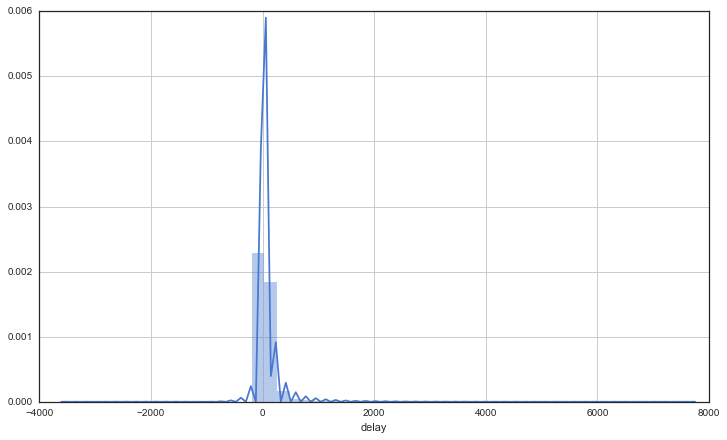

In [15]:
plt.figure(figsize=(12,7))
sns.distplot(data_clean["delay"])
plt.grid()
plt.show()

In [16]:
# data_pos = data_clean.sort(columns="delay", ascending=False).ix[data_clean['delay']>=0]
data_pos= data_clean.sort(columns="delay", ascending=False)
data_pos.head()

,data_freshness,date,delay,etat,expected_passage_day,expected_passage_time,miss,request_day,request_time,station,...,day_train_num,scheduled_departure_time,trip_id,service_id,route_short_name,trip_headsign,stop_sequence,jour,jour_clean,Nom_station
275637,416.0,2017-02-06 15:32:00,7740.0,NaN,20170206,15:32:00,VICK,20170206,15:25:04,87393652,...,20170206_148618,13:23:00,DUASN148618F01007-1_402213,9127.0,C,VICK,10.0,Monday,2017-02-06,GARE DE PETIT VAUX
280153,356.0,2017-02-06 15:16:00,7680.0,NaN,20170206,15:16:00,VICK,20170206,15:10:04,87393579,...,20170206_148618,13:08:00,DUASN148618F01007-1_402213,9127.0,C,VICK,6.0,Monday,2017-02-06,GARE DE MASSY PALAISEAU RER C
275724,84.0,2017-02-06 15:28:00,7680.0,NaN,20170206,15:28:00,VICK,20170206,15:26:36,87393645,...,20170206_148618,13:20:00,DUASN148618F01007-1_402213,9127.0,C,VICK,9.0,Monday,2017-02-06,GARE DE GRAVIGNY BALIZY
288515,296.0,2017-02-06 15:35:00,7680.0,NaN,20170206,15:35:00,VICK,20170206,15:30:04,87545236,...,20170206_148618,13:27:00,DUASN148618F01007-1_402213,9127.0,C,VICK,11.0,Monday,2017-02-06,GARE DE SAVIGNY SUR ORGE
275975,235.0,2017-02-06 15:24:00,7620.0,NaN,20170206,15:24:00,VICK,20170206,15:20:05,87393637,...,20170206_148618,13:17:00,DUASN148618F01007-1_402213,9127.0,C,VICK,8.0,Monday,2017-02-06,GARE DE CHILLY MAZARIN


In [17]:
data_pos.describe()
#On remarque des retards négatifs (train à l'avance)

,data_freshness,delay,expected_passage_day,request_day,station,term,station_id,service_id,stop_sequence
count,535846.000000,535846.000000,5.358460e+05,5.358460e+05,5.358460e+05,5.358460e+05,5.358460e+05,535846.000000,535846.000000
mean,1008.832385,79.764820,2.017021e+07,2.017021e+07,8.738240e+07,8.737410e+07,8.738240e+06,9443.304716,6.743897
std,2986.596880,209.927898,4.064585e+00,4.631538e+00,1.579531e+05,1.487694e+05,1.579531e+04,337.495011,5.999340
min,0.000000,-3600.000000,2.017020e+07,2.017013e+07,8.711128e+07,8.711300e+07,8.711127e+06,9075.000000,0.000000
25%,117.000000,0.000000,2.017020e+07,2.017020e+07,8.727634e+07,8.727622e+07,8.727634e+06,9169.000000,2.000000
50%,210.000000,0.000000,2.017021e+07,2.017021e+07,8.738233e+07,8.738401e+07,8.738233e+06,9322.000000,5.000000
75%,321.000000,60.000000,2.017021e+07,2.017021e+07,8.739354e+07,8.739316e+07,8.739353e+06,9661.000000,9.000000
max,21598.000000,7740.000000,2.017021e+07,2.017021e+07,8.775861e+07,8.775858e+07,8.775860e+06,10283.000000,33.000000


In [18]:
tmp = data_pos.groupby(data_pos["Nom_station"])['delay'].mean()

In [19]:
tmp.sort(ascending = False)
tmp

Nom_station
GARE D'ISSY VAL DE SEINE               216.025370
AVENUE DU PRESIDENT KENNEDY            215.773381
GARE D'ISSY                            215.344901
BOULAINVILLIERS                        214.770889
NEUILLY PORTE MAILLOT                  208.440860
CHAMP DE MARS TOUR EIFFEL              205.563867
PONT DE L ALMA                         204.846043
BOULEVARD VICTOR PONT DU GARIGLIANO    202.832981
PEREIRE LEVALLOIS                      201.574240
GARE D'EPINAY SUR SEINE                200.681597
GARE DE PETIT VAUX                     198.480243
GARE D'IVRY SUR SEINE                  198.054545
PORTE DE CLICHY                        195.026834
AVENUE FOCH                            194.720992
JAVEL                                  194.060914
MUSEE D ORSAY                          193.314488
INVALIDES                              191.550968
GARE DE ST GRATIEN                     190.819672
GARE D'ABLON                           187.752809
GARE DE VILLENEUVE LE ROI             

In [20]:
dir = tmp.sort_values(ascending=False).index[:70]
piv = pd.pivot_table(data = data_pos[data_pos["Nom_station"].isin(dir)],
                                        index=["jour"],
                                        columns=["Nom_station"],
                                        values=["delay"],
                                        aggfunc= np.mean)
print(piv)

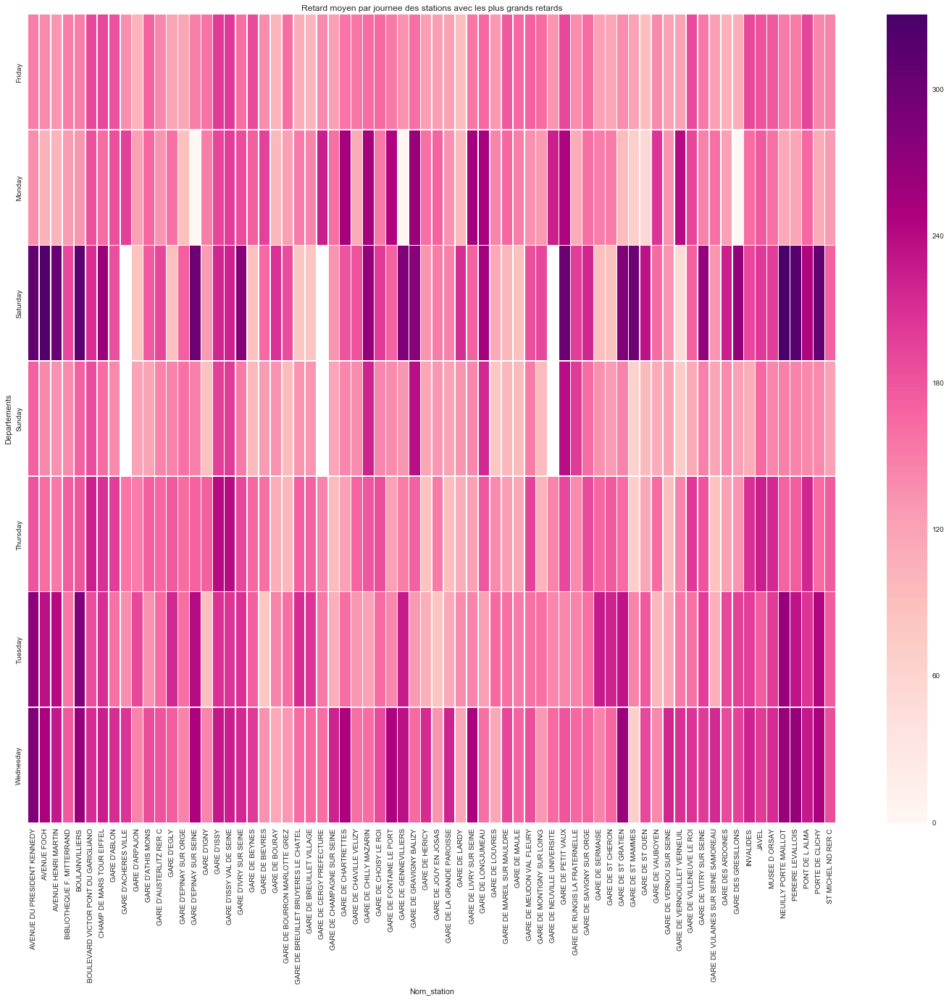

In [21]:
fig,ax = plt.subplots(figsize=(25,20))
sns.heatmap(piv['delay'],vmin=0,annot=False,linewidth=.5,ax=ax,cmap="RdPu")
plt.title('Retard moyen par journee des stations avec les plus grands retards')
plt.ylabel('Departements')

In [22]:
tmp_jour = data_pos.groupby(data_pos["jour"])['delay'].mean()
tmp_jour

jour
Friday       78.922800
Monday       80.075007
Saturday     85.884118
Sunday       59.369035
Thursday     76.786538
Tuesday      85.040993
Wednesday    88.326452
Name: delay, dtype: float64

In [23]:
# import plotly.plotly as py
# import plotly.graph_objs as go
# fig = {
#     'data': [{'labels': ['Lundi', 'Mardi', 'Mercredi', 'Jeudi', 'Vendredi', 'Samedi', 'Dimanche'],
#               'values': [80.075007, 85.040993, 88.326452, 76.786538, 78.922800, 85.884118, 59.369035],
#               'type': 'pie'}],
#     'layout': {'title': 'Retards par jour de la semaine (sur deux semaines d\'historique)'}
#      }

# py.iplot(fig)

In [24]:
tmp_jour = data_pos.groupby(data_pos["jour"])['delay'].sum()
tmp_jour


jour
Friday       6573480.0
Monday       3288120.0
Saturday     5496240.0
Sunday       3421200.0
Thursday     6392940.0
Tuesday      7032720.0
Wednesday    7359360.0
Name: delay, dtype: float64

In [1]:
import plotly.plotly as py
import plotly.graph_objs as go
fig = {
    'data': [{'labels': ['Lundi', 'Mardi', 'Mercredi', 'Jeudi', 'Vendredi', 'Samedi', 'Dimanche'],
              'values': [3288120.0, 7032720.0, 7359360.0, 6392940.0, 6573480.0, 5496240.0, 3421200.0],
              'type': 'pie'}],
    'layout': {'title': 'Retards par jour de la semaine (sur deux semaines d\'historique)'}
     }

py.iplot(fig)

PlotlyRequestError: No message

In [26]:
routes = pd.read_csv("data/routes.txt")
agencies = pd.read_csv("data/agency.txt")

In [27]:
routes.drop(['route_desc','route_url','route_color','route_text_color','route_type']
            ,axis=1,inplace=True)
routes

,route_id,agency_id,route_short_name,route_long_name
0,DUA8008530210013,DUA853,H,Ermont Eaubonne - Persan Beaumont
1,DUA8008530212001,DUA853,H,Ermont Eaubonne - Pontoise
2,DUA8008530212013,DUA853,H,Ermont Eaubonne - Valmondois
3,DUA8008530212037,DUA853,H,Gare du Nord Surface - Ermont Eaubonne
4,DUA8008530210011,DUA853,H,Gare du Nord Surface - Luzarches
5,DUA8008530210007,DUA853,H,Gare du Nord Surface - Montsoult Maffliers
6,DUA8008530210003,DUA853,H,Gare du Nord Surface - Persan Beaumont (Montso...
7,DUA8008530210015,DUA853,H,Gare du Nord Surface - Persan Beaumont (Valmon...
8,DUA8008530212005,DUA853,H,Gare du Nord Surface - Pontoise
9,DUA8008530210009,DUA853,H,Gare du Nord Surface - Saint-Leu la Forêt


In [28]:
agencies.drop(['agency_url','agency_timezone','agency_lang'],axis=1,inplace=True)
agencies

,agency_id,agency_name
0,DUA853,Paris Nord
1,DUA802,RER B
2,DUA850,Paris Est
3,DUA855,La Verrière - La Défense
4,DUA851,Paris Sud Est
5,DUA852,Paris Rive Gauche
6,DUA854,Paris St Lazare
7,DUA801,RER A
8,DUA803,RER C
9,DUA804,RER D


In [29]:
routes_and_agencies = routes.merge(agencies,on='agency_id')
routes_and_agencies

,route_id,agency_id,route_short_name,route_long_name,agency_name
0,DUA8008530210013,DUA853,H,Ermont Eaubonne - Persan Beaumont,Paris Nord
1,DUA8008530212001,DUA853,H,Ermont Eaubonne - Pontoise,Paris Nord
2,DUA8008530212013,DUA853,H,Ermont Eaubonne - Valmondois,Paris Nord
3,DUA8008530212037,DUA853,H,Gare du Nord Surface - Ermont Eaubonne,Paris Nord
4,DUA8008530210011,DUA853,H,Gare du Nord Surface - Luzarches,Paris Nord
5,DUA8008530210007,DUA853,H,Gare du Nord Surface - Montsoult Maffliers,Paris Nord
6,DUA8008530210003,DUA853,H,Gare du Nord Surface - Persan Beaumont (Montso...,Paris Nord
7,DUA8008530210015,DUA853,H,Gare du Nord Surface - Persan Beaumont (Valmon...,Paris Nord
8,DUA8008530212005,DUA853,H,Gare du Nord Surface - Pontoise,Paris Nord
9,DUA8008530210009,DUA853,H,Gare du Nord Surface - Saint-Leu la Forêt,Paris Nord


In [30]:
routes_and_agencies = routes.merge(agencies,on='agency_id')
routes_and_agencies
print(routes_and_agencies['route_short_name'].unique())
print(routes_and_agencies['agency_name'].unique())

print('*********************************************************')

for agency in routes_and_agencies['agency_name'].unique():
    print(agency + ' : ' )
    print(routes_and_agencies[routes_and_agencies.agency_name == agency]['route_short_name']
          .unique())
    print(routes_and_agencies[routes_and_agencies.agency_name == agency]['route_long_name']
          .unique())
    print()

In [31]:
routes_and_agencies_short = routes_and_agencies.drop(['route_id','agency_id',
                                                      'route_long_name'],axis=1).drop_duplicates().reset_index().drop('index',axis=1)
routes_and_agencies_short

,route_short_name,agency_name
0,H,Paris Nord
1,K,Paris Nord
2,Aéroport C,RER B
3,B,RER B
4,P,Paris Est
5,T4,Paris Est
6,U,La Verrière - La Défense
7,R,Paris Sud Est
8,N,Paris Rive Gauche
9,J,Paris St Lazare


In [32]:
def get_agency_name(route):
    return routes_and_agencies_short[routes_and_agencies_short.route_short_name == route].agency_name.values[0]
data_with_agencies = data.merge(routes_and_agencies_short,on='route_short_name')
data_with_agencies

,data_freshness,date,delay,etat,expected_passage_day,expected_passage_time,miss,request_day,request_time,station,...,scheduled_departure_time,trip_id,service_id,route_short_name,trip_headsign,stop_sequence,jour,jour_clean,Nom_station,agency_name
0,21418.0,2017-02-01 05:28:00,0.0,NaN,20170201,05:28:00,ZOHA,20170131,23:31:02,87682450,...,05:28:00,DUASN151504F01001-1_411022,9322.0,R,ZOHA,3.0,Wednesday,2017-02-01,GARE DE CHAMPAGNE SUR SEINE,Paris Sud Est
1,18717.0,2017-02-01 05:07:00,0.0,NaN,20170201,05:07:00,POMA,20170131,23:55:03,87684217,...,05:07:00,DUASN151910F01004-1_410948,9322.0,R,POMA,3.0,Wednesday,2017-02-01,GARE DE SOUPPES,Paris Sud Est
2,19077.0,2017-02-01 05:14:00,0.0,NaN,20170201,05:14:00,ZOHA,20170131,23:56:03,87682302,...,05:14:00,DUASN151504F01001-1_411022,9322.0,R,ZOHA,0.0,Wednesday,2017-02-01,GARE DE MONTEREAU,Paris Sud Est
3,19616.0,2017-02-01 05:13:00,0.0,NaN,20170201,05:13:00,POMA,20170131,23:46:04,87684191,...,05:13:00,DUASN151910F01004-1_410948,9322.0,R,POMA,4.0,Wednesday,2017-02-01,GARE DE BAGNEAUX SUR LOING,Paris Sud Est
4,19437.0,2017-02-01 05:19:00,0.0,NaN,20170201,05:19:00,ZOHA,20170131,23:55:03,87682476,...,05:19:00,DUASN151504F01001-1_411022,9322.0,R,ZOHA,1.0,Wednesday,2017-02-01,GARE DE LA GRANDE PAROISSE,Paris Sud Est
5,21177.0,2017-02-01 05:18:00,0.0,NaN,20170201,05:18:00,POMA,20170131,23:25:03,87684126,...,05:18:00,DUASN151910F01004-1_410948,9322.0,R,POMA,5.0,Wednesday,2017-02-01,GARE DE NEMOURS ST PIERRE,Paris Sud Est
6,19617.0,2017-02-01 05:23:00,0.0,NaN,20170201,05:23:00,ZOHA,20170131,23:56:03,87682468,...,05:23:00,DUASN151504F01001-1_411022,9322.0,R,ZOHA,2.0,Wednesday,2017-02-01,GARE DE VERNOU SUR SEINE,Paris Sud Est
7,20757.0,2017-02-01 05:42:00,0.0,NaN,20170201,05:42:00,PUMA,20170131,23:56:03,87682302,...,05:42:00,DUASN152920F01002-1_410981,9322.0,R,PUMA,0.0,Wednesday,2017-02-01,GARE DE MONTEREAU,Paris Sud Est
8,20937.0,2017-02-01 05:45:00,0.0,NaN,20170201,05:45:00,ZOHA,20170131,23:56:03,87682302,...,05:45:00,DUASN151508F01001-1_411032,9322.0,R,ZOHA,0.0,Wednesday,2017-02-01,GARE DE MONTEREAU,Paris Sud Est
9,21057.0,2017-02-01 05:46:00,0.0,NaN,20170201,05:46:00,POME,20170131,23:55:03,87684217,...,05:46:00,DUASN151914F01001-1_410942,9322.0,R,POME,1.0,Wednesday,2017-02-01,GARE DE SOUPPES,Paris Sud Est


In [33]:
data.route_short_name.unique()


array(['R', 'C', 'N', nan, 'D', 'H', 'J', 'E', 'P', 'U', 'L', 'K'], dtype=object)

### RER A manquant..

In [34]:
data.columns

Index([          u'data_freshness',                     u'date',
                          u'delay',                     u'etat',
           u'expected_passage_day',    u'expected_passage_time',
                           u'miss',              u'request_day',
                   u'request_time',                  u'station',
                           u'term',                u'train_num',
                     u'station_id',            u'day_train_num',
       u'scheduled_departure_time',                  u'trip_id',
                     u'service_id',         u'route_short_name',
                  u'trip_headsign',            u'stop_sequence',
                           u'jour',               u'jour_clean',
                    u'Nom_station'],
      dtype='object')

In [35]:
trips = pd.read_csv('data/trips.txt').drop(['direction_id','block_id','trip_id','trip_headsign']
                                           ,axis=1)
trips

,route_id,service_id
0,DUA8008530210013,9924
1,DUA8008530210013,9925
2,DUA8008530210013,8831
3,DUA8008530210013,8831
4,DUA8008530210013,8831
5,DUA8008530210013,9923
6,DUA8008530210013,9924
7,DUA8008530212001,9900
8,DUA8008530212001,9945
9,DUA8008530212001,9900


In [36]:
routes_and_trips = routes_and_agencies.merge(trips,on='route_id').drop('route_short_name'
                                                                       ,axis=1)
routes_and_trips

,route_id,agency_id,route_long_name,agency_name,service_id
0,DUA8008530210013,DUA853,Ermont Eaubonne - Persan Beaumont,Paris Nord,9924
1,DUA8008530210013,DUA853,Ermont Eaubonne - Persan Beaumont,Paris Nord,9925
2,DUA8008530210013,DUA853,Ermont Eaubonne - Persan Beaumont,Paris Nord,8831
3,DUA8008530210013,DUA853,Ermont Eaubonne - Persan Beaumont,Paris Nord,8831
4,DUA8008530210013,DUA853,Ermont Eaubonne - Persan Beaumont,Paris Nord,8831
5,DUA8008530210013,DUA853,Ermont Eaubonne - Persan Beaumont,Paris Nord,9923
6,DUA8008530210013,DUA853,Ermont Eaubonne - Persan Beaumont,Paris Nord,9924
7,DUA8008530212001,DUA853,Ermont Eaubonne - Pontoise,Paris Nord,9900
8,DUA8008530212001,DUA853,Ermont Eaubonne - Pontoise,Paris Nord,9945
9,DUA8008530212001,DUA853,Ermont Eaubonne - Pontoise,Paris Nord,9900


In [37]:
data_with_agencies = data.merge(routes_and_trips,on='service_id')
data_with_agencies

,data_freshness,date,delay,etat,expected_passage_day,expected_passage_time,miss,request_day,request_time,station,...,route_short_name,trip_headsign,stop_sequence,jour,jour_clean,Nom_station,route_id,agency_id,route_long_name,agency_name
0,21418.0,2017-02-01 05:28:00,0.0,NaN,20170201,05:28:00,ZOHA,20170131,23:31:02,87682450,...,R,ZOHA,3.0,Wednesday,2017-02-01,GARE DE CHAMPAGNE SUR SEINE,DUA8008040810029,DUA804,Goussainville - Melun via Combs la Ville Quincy,RER D
1,16857.0,2017-02-01 04:37:00,0.0,NaN,20170201,04:37:00,PORO,20170131,23:56:03,87393314,...,N,PORO,0.0,Wednesday,2017-02-01,GARE DE RAMBOUILLET,DUA8008040810029,DUA804,Goussainville - Melun via Combs la Ville Quincy,RER D
2,17337.0,2017-02-01 04:44:00,0.0,NaN,20170201,04:44:00,PUCO,20170131,23:55:03,87381509,...,J,PICA,0.0,Wednesday,2017-02-01,GARE DE MANTES LA JOLIE,DUA8008040810029,DUA804,Goussainville - Melun via Combs la Ville Quincy,RER D
3,17157.0,2017-02-01 04:41:00,0.0,NaN,20170201,04:41:00,DOPA,20170131,23:55:03,87681007,...,D,DOPA,0.0,Wednesday,2017-02-01,GARE DE CORBEIL ESSONNES,DUA8008040810029,DUA804,Goussainville - Melun via Combs la Ville Quincy,RER D
4,17157.0,2017-02-01 04:42:00,0.0,NaN,20170201,04:42:00,PORO,20170131,23:56:03,87393298,...,N,PORO,1.0,Wednesday,2017-02-01,GARE DU PERRAY,DUA8008040810029,DUA804,Goussainville - Melun via Combs la Ville Quincy,RER D
5,17517.0,2017-02-01 04:47:00,0.0,NaN,20170201,04:47:00,PORO,20170131,23:55:03,87393280,...,N,PORO,2.0,Wednesday,2017-02-01,GARE DES ESSARTS LE ROI,DUA8008040810029,DUA804,Goussainville - Melun via Combs la Ville Quincy,RER D
6,17516.0,2017-02-01 04:47:00,0.0,NaN,20170201,04:47:00,DOPA,20170131,23:55:04,87681387,...,D,DOPA,2.0,Wednesday,2017-02-01,GARE D'EVRY COURCOURONNES,DUA8008040810029,DUA804,Goussainville - Melun via Combs la Ville Quincy,RER D
7,17336.0,2017-02-01 04:44:00,0.0,NaN,20170201,04:44:00,DOPA,20170131,23:55:04,87681395,...,D,DOPA,1.0,Wednesday,2017-02-01,GARE DU BRAS DE FER,DUA8008040810029,DUA804,Goussainville - Melun via Combs la Ville Quincy,RER D
8,17398.0,2017-02-01 04:46:00,0.0,NaN,20170201,04:46:00,PUCO,20170131,23:56:02,87381590,...,J,PICA,1.0,Wednesday,2017-02-01,GARE DE MANTES STATION,DUA8008040810029,DUA804,Goussainville - Melun via Combs la Ville Quincy,RER D
9,17697.0,2017-02-01 04:50:00,0.0,NaN,20170201,04:50:00,PUCO,20170131,23:55:03,87381582,...,J,PICA,2.0,Wednesday,2017-02-01,GARE DE LIMAY,DUA8008040810029,DUA804,Goussainville - Melun via Combs la Ville Quincy,RER D


In [38]:
print(routes_and_agencies['route_short_name'].unique())
print(routes_and_agencies['agency_name'].unique())

print('*********************************************************')

for agency in routes_and_agencies['agency_name'].unique():
    print(agency + ' : ' )
    print(routes_and_agencies[routes_and_agencies.agency_name == agency]['route_short_name']
          .unique())
    print(routes_and_agencies[routes_and_agencies.agency_name == agency]['route_long_name']
          .unique())
    print()

In [39]:
routes_and_agencies_short = routes_and_agencies.drop(['route_id','agency_id',
                                                      'route_long_name'],axis=1).drop_duplicates().reset_index().drop('index',axis=1)
routes_and_agencies_short

,route_short_name,agency_name
0,H,Paris Nord
1,K,Paris Nord
2,Aéroport C,RER B
3,B,RER B
4,P,Paris Est
5,T4,Paris Est
6,U,La Verrière - La Défense
7,R,Paris Sud Est
8,N,Paris Rive Gauche
9,J,Paris St Lazare


In [40]:
data_with_agencies = data.merge(routes_and_agencies_short,on='route_short_name')
data_with_agencies

,data_freshness,date,delay,etat,expected_passage_day,expected_passage_time,miss,request_day,request_time,station,...,scheduled_departure_time,trip_id,service_id,route_short_name,trip_headsign,stop_sequence,jour,jour_clean,Nom_station,agency_name
0,21418.0,2017-02-01 05:28:00,0.0,NaN,20170201,05:28:00,ZOHA,20170131,23:31:02,87682450,...,05:28:00,DUASN151504F01001-1_411022,9322.0,R,ZOHA,3.0,Wednesday,2017-02-01,GARE DE CHAMPAGNE SUR SEINE,Paris Sud Est
1,18717.0,2017-02-01 05:07:00,0.0,NaN,20170201,05:07:00,POMA,20170131,23:55:03,87684217,...,05:07:00,DUASN151910F01004-1_410948,9322.0,R,POMA,3.0,Wednesday,2017-02-01,GARE DE SOUPPES,Paris Sud Est
2,19077.0,2017-02-01 05:14:00,0.0,NaN,20170201,05:14:00,ZOHA,20170131,23:56:03,87682302,...,05:14:00,DUASN151504F01001-1_411022,9322.0,R,ZOHA,0.0,Wednesday,2017-02-01,GARE DE MONTEREAU,Paris Sud Est
3,19616.0,2017-02-01 05:13:00,0.0,NaN,20170201,05:13:00,POMA,20170131,23:46:04,87684191,...,05:13:00,DUASN151910F01004-1_410948,9322.0,R,POMA,4.0,Wednesday,2017-02-01,GARE DE BAGNEAUX SUR LOING,Paris Sud Est
4,19437.0,2017-02-01 05:19:00,0.0,NaN,20170201,05:19:00,ZOHA,20170131,23:55:03,87682476,...,05:19:00,DUASN151504F01001-1_411022,9322.0,R,ZOHA,1.0,Wednesday,2017-02-01,GARE DE LA GRANDE PAROISSE,Paris Sud Est
5,21177.0,2017-02-01 05:18:00,0.0,NaN,20170201,05:18:00,POMA,20170131,23:25:03,87684126,...,05:18:00,DUASN151910F01004-1_410948,9322.0,R,POMA,5.0,Wednesday,2017-02-01,GARE DE NEMOURS ST PIERRE,Paris Sud Est
6,19617.0,2017-02-01 05:23:00,0.0,NaN,20170201,05:23:00,ZOHA,20170131,23:56:03,87682468,...,05:23:00,DUASN151504F01001-1_411022,9322.0,R,ZOHA,2.0,Wednesday,2017-02-01,GARE DE VERNOU SUR SEINE,Paris Sud Est
7,20757.0,2017-02-01 05:42:00,0.0,NaN,20170201,05:42:00,PUMA,20170131,23:56:03,87682302,...,05:42:00,DUASN152920F01002-1_410981,9322.0,R,PUMA,0.0,Wednesday,2017-02-01,GARE DE MONTEREAU,Paris Sud Est
8,20937.0,2017-02-01 05:45:00,0.0,NaN,20170201,05:45:00,ZOHA,20170131,23:56:03,87682302,...,05:45:00,DUASN151508F01001-1_411032,9322.0,R,ZOHA,0.0,Wednesday,2017-02-01,GARE DE MONTEREAU,Paris Sud Est
9,21057.0,2017-02-01 05:46:00,0.0,NaN,20170201,05:46:00,POME,20170131,23:55:03,87684217,...,05:46:00,DUASN151914F01001-1_410942,9322.0,R,POME,1.0,Wednesday,2017-02-01,GARE DE SOUPPES,Paris Sud Est


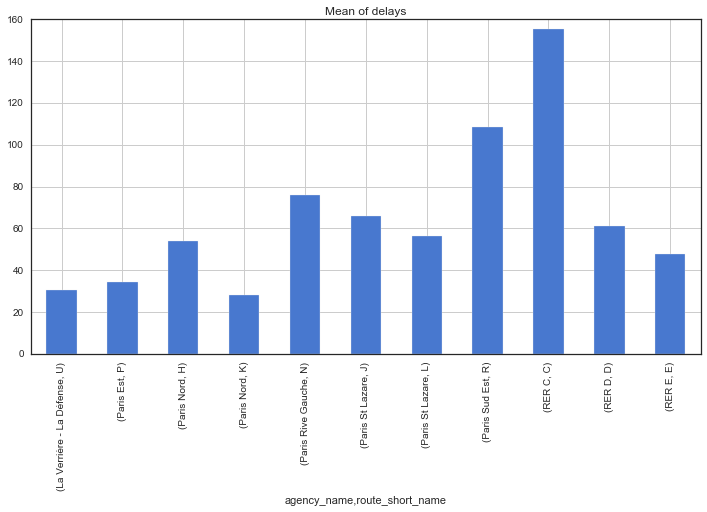

In [41]:
total_delays = data_with_agencies.groupby(['agency_name','route_short_name']).mean()['delay']
#total_delays
fig = plt.figure(figsize = (12,6))
total_delays.plot.bar(stacked=True);
plt.grid()
plt.title('Mean of delays')

In [42]:
data_with_agencies[data_with_agencies['agency_name'] == 'RER A'].route_short_name

Series([], Name: route_short_name, dtype: object)

In [43]:
pd.value_counts(data_with_agencies[data_with_agencies.route_short_name == 'L']['delay'])

 0.0       48157
 60.0      17245
 120.0      7438
 180.0      3294
 240.0      1851
 300.0      1196
 360.0       688
 420.0       381
 480.0       277
 540.0       222
 600.0       173
-60.0        159
 660.0       121
 720.0        72
 780.0        56
 900.0        49
 840.0        49
-600.0        44
 960.0        26
 1080.0       19
 1020.0       17
 1200.0       16
 1140.0       15
 1380.0       15
-540.0        14
 1320.0       13
 1260.0        8
 1560.0        8
 3660.0        6
-360.0         6
           ...  
 2340.0        4
-240.0         3
 3720.0        3
 1920.0        3
 1440.0        3
 2820.0        3
 1740.0        2
 2760.0        2
-3480.0        2
 3480.0        2
-3600.0        2
 3240.0        2
 1680.0        2
 3840.0        2
 2700.0        2
 2640.0        2
 2520.0        2
 2100.0        2
 3120.0        1
 3360.0        1
 2220.0        1
-120.0         1
 3540.0        1
 3600.0        1
-420.0         1
 3780.0        1
-300.0         1
 1800.0       

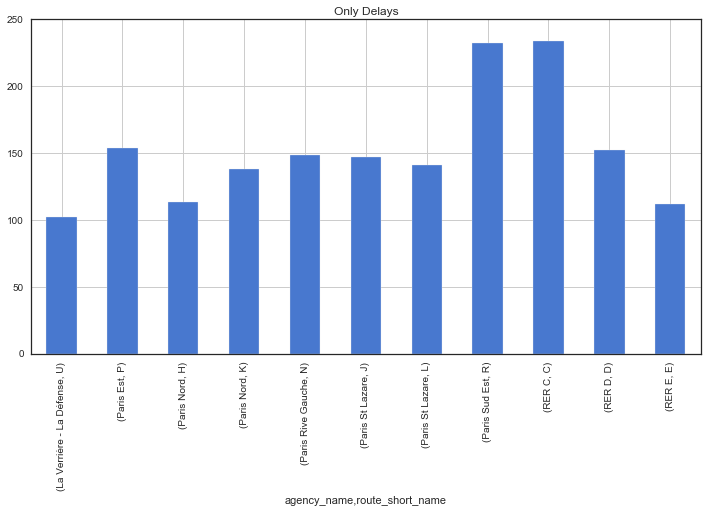

In [44]:
only_with_delays = data_with_agencies[data_with_agencies.delay > 0]
total_delays = only_with_delays.groupby(['agency_name','route_short_name']).mean()['delay']
fig = plt.figure(figsize = (12,6))
total_delays.plot(kind='bar',)
plt.grid()
plt.title('Only Delays')

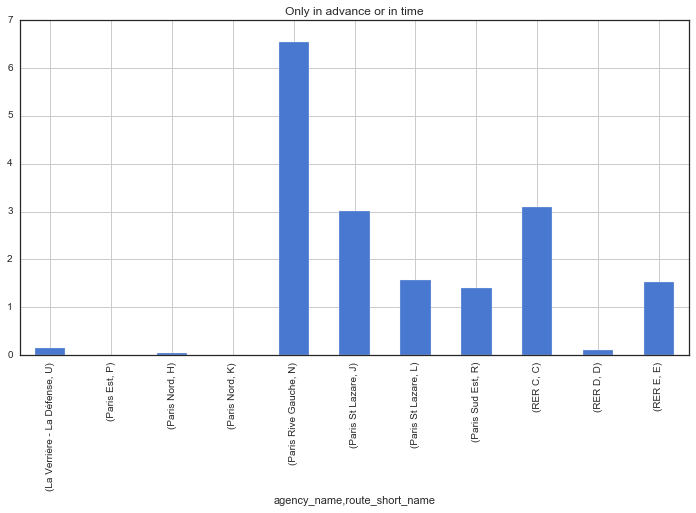

In [45]:
only_in_advance = data_with_agencies[data_with_agencies.delay <= 0]
total_delays = only_in_advance.groupby(['agency_name','route_short_name']).mean()['delay'] * -1
fig = plt.figure(figsize = (12,6))
total_delays.plot(kind='bar')
plt.grid()
plt.title('Only in advance or in time')

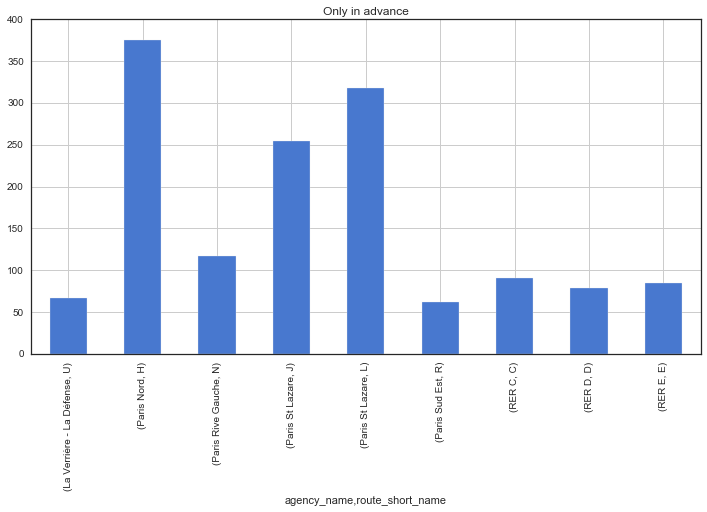

In [46]:
only_in_advance = data_with_agencies[data_with_agencies.delay < 0]
total_delays = only_in_advance.groupby(['agency_name','route_short_name']).mean()['delay'] * -1
fig = plt.figure(figsize = (12,6))
total_delays.plot(kind='bar')
plt.grid()
plt.title('Only in advance')

## Etude sur une journée :

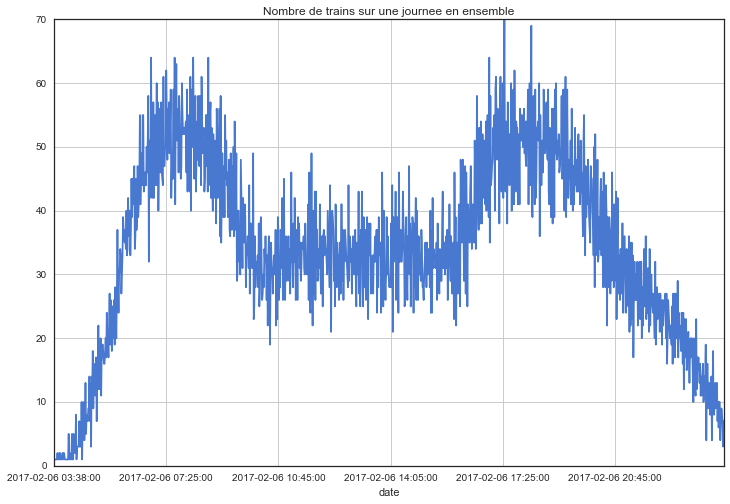

In [47]:
# journée du 2017-02-06
data_one_day = data_with_agencies[(data_with_agencies['date'] >= '2017-02-06 00:00:00') & 
                   (data_with_agencies['date'] <= '2017-02-06 23:59:59')]
fig = plt.figure(figsize=(12,8))
data_one_day.groupby('date').count()['train_num'].plot()
plt.grid()
plt.title('Nombre de trains sur une journee en ensemble')

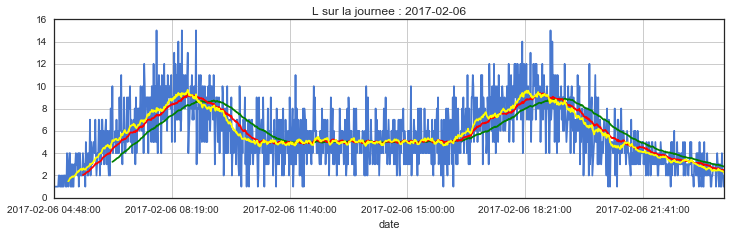

In [48]:
fig = plt.figure(figsize = (12,8))
plt.subplot(211)
a = data_one_day[data_one_day.route_short_name == 'L'].groupby('date').count()['train_num']
a.plot()

from pandas import Series
a.rolling(window=100,center=False).mean().plot(color='green')
a.rolling(window=50,center=False).mean().plot(color='red')
a.rolling(window=25,center=False).mean().plot(color='yellow')

plt.grid()
plt.title('L sur la journee : 2017-02-06')

### Nombre de trains en circulation

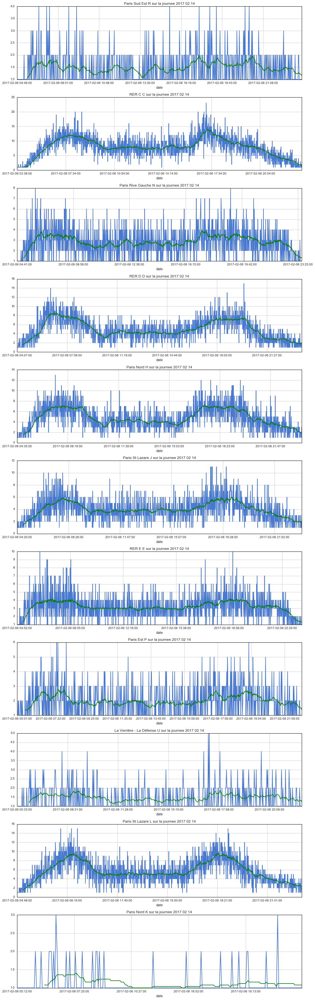

In [49]:
data_one_day = data_with_agencies[(data_with_agencies['date'] >= '2017-02-06 00:00:00') & 
                   (data_with_agencies['date'] <= '2017-02-06 23:59:59')]

l = len(data_one_day.route_short_name.unique())
fig = plt.figure(figsize=(14, l*4))

for i,route in enumerate(data_one_day.route_short_name.unique()) :
    plt.subplot(l,1,i+1)
    a = data_one_day[data_one_day.route_short_name == route].groupby('date').count()['train_num']
    a.plot()
    a.rolling(window=25,center=False).mean().plot(color='green')
    plt.title(get_agency_name(route) + ' ' + route + ' sur la journee 2017 02 14')
    plt.grid()
    plt.tight_layout()
    

### Pour le dimanche 05-02-2017

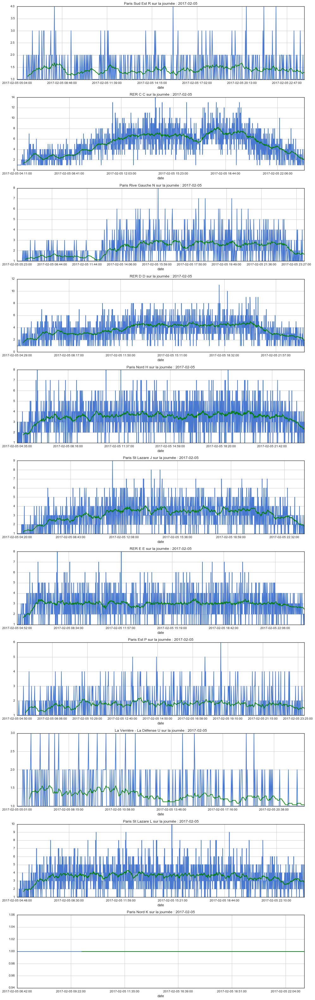

In [50]:
data_one_day = data_with_agencies[(data_with_agencies['date'] >= '2017-02-05 00:00:00') & 
                   (data_with_agencies['date'] <= '2017-02-05 23:59:59')]

l = len(data_one_day.route_short_name.unique())
fig = plt.figure(figsize=(14, l*4))
for i,route in enumerate(data_one_day.route_short_name.unique()) :
    plt.subplot(l,1,i+1)
    a = data_one_day[data_one_day.route_short_name == route].groupby('date').count()['train_num']
    a.plot()
    a.rolling(window=25,center=False).mean().plot(color='green')
    plt.title(get_agency_name(route) + ' ' + route + ' sur la journée : 2017-02-05')
    plt.grid()
    plt.tight_layout()

### Moyenne des retards

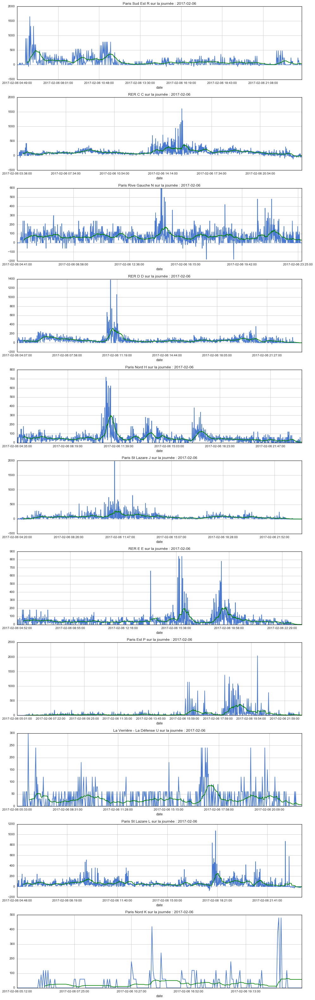

In [51]:
data_one_day = data_with_agencies[(data_with_agencies['date'] >= '2017-02-06 00:00:00') & 
                   (data_with_agencies['date'] <= '2017-02-06 23:59:59')]

l = len(data_one_day.route_short_name.unique())
fig = plt.figure(figsize=(14, l*4))

for i,route in enumerate(data_one_day.route_short_name.unique()) :
    plt.subplot(l,1,i+1)
    a = data_one_day[data_one_day.route_short_name == route].groupby('date').mean()['delay']
    a.plot()
    a.rolling(window=25,center=False).mean().plot(color='green')
    plt.title(get_agency_name(route) + ' ' + route + ' sur la journée : 2017-02-06')
    plt.grid()
    plt.tight_layout()


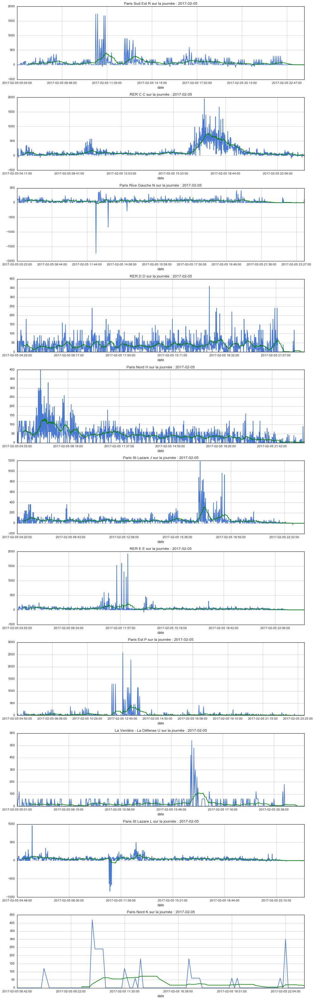

In [52]:
data_one_day = data_with_agencies[(data_with_agencies['date'] >= '2017-02-05 00:00:00') & 
                   (data_with_agencies['date'] <= '2017-02-05 23:59:59')]

l = len(data_one_day.route_short_name.unique())
fig = plt.figure(figsize=(14, l*4))

for i,route in enumerate(data_one_day.route_short_name.unique()) :
    plt.subplot(l,1,i+1)
    a = data_one_day[data_one_day.route_short_name == route].groupby('date').mean()['delay']
    a.plot()
    a.rolling(window=25,center=False).mean().plot(color='green')
    plt.title(get_agency_name(route) + ' ' + route + ' sur la journée : 2017-02-05')
    plt.grid()
    plt.tight_layout()

In [53]:
data_with_agencies

,data_freshness,date,delay,etat,expected_passage_day,expected_passage_time,miss,request_day,request_time,station,...,scheduled_departure_time,trip_id,service_id,route_short_name,trip_headsign,stop_sequence,jour,jour_clean,Nom_station,agency_name
0,21418.0,2017-02-01 05:28:00,0.0,NaN,20170201,05:28:00,ZOHA,20170131,23:31:02,87682450,...,05:28:00,DUASN151504F01001-1_411022,9322.0,R,ZOHA,3.0,Wednesday,2017-02-01,GARE DE CHAMPAGNE SUR SEINE,Paris Sud Est
1,18717.0,2017-02-01 05:07:00,0.0,NaN,20170201,05:07:00,POMA,20170131,23:55:03,87684217,...,05:07:00,DUASN151910F01004-1_410948,9322.0,R,POMA,3.0,Wednesday,2017-02-01,GARE DE SOUPPES,Paris Sud Est
2,19077.0,2017-02-01 05:14:00,0.0,NaN,20170201,05:14:00,ZOHA,20170131,23:56:03,87682302,...,05:14:00,DUASN151504F01001-1_411022,9322.0,R,ZOHA,0.0,Wednesday,2017-02-01,GARE DE MONTEREAU,Paris Sud Est
3,19616.0,2017-02-01 05:13:00,0.0,NaN,20170201,05:13:00,POMA,20170131,23:46:04,87684191,...,05:13:00,DUASN151910F01004-1_410948,9322.0,R,POMA,4.0,Wednesday,2017-02-01,GARE DE BAGNEAUX SUR LOING,Paris Sud Est
4,19437.0,2017-02-01 05:19:00,0.0,NaN,20170201,05:19:00,ZOHA,20170131,23:55:03,87682476,...,05:19:00,DUASN151504F01001-1_411022,9322.0,R,ZOHA,1.0,Wednesday,2017-02-01,GARE DE LA GRANDE PAROISSE,Paris Sud Est
5,21177.0,2017-02-01 05:18:00,0.0,NaN,20170201,05:18:00,POMA,20170131,23:25:03,87684126,...,05:18:00,DUASN151910F01004-1_410948,9322.0,R,POMA,5.0,Wednesday,2017-02-01,GARE DE NEMOURS ST PIERRE,Paris Sud Est
6,19617.0,2017-02-01 05:23:00,0.0,NaN,20170201,05:23:00,ZOHA,20170131,23:56:03,87682468,...,05:23:00,DUASN151504F01001-1_411022,9322.0,R,ZOHA,2.0,Wednesday,2017-02-01,GARE DE VERNOU SUR SEINE,Paris Sud Est
7,20757.0,2017-02-01 05:42:00,0.0,NaN,20170201,05:42:00,PUMA,20170131,23:56:03,87682302,...,05:42:00,DUASN152920F01002-1_410981,9322.0,R,PUMA,0.0,Wednesday,2017-02-01,GARE DE MONTEREAU,Paris Sud Est
8,20937.0,2017-02-01 05:45:00,0.0,NaN,20170201,05:45:00,ZOHA,20170131,23:56:03,87682302,...,05:45:00,DUASN151508F01001-1_411032,9322.0,R,ZOHA,0.0,Wednesday,2017-02-01,GARE DE MONTEREAU,Paris Sud Est
9,21057.0,2017-02-01 05:46:00,0.0,NaN,20170201,05:46:00,POME,20170131,23:55:03,87684217,...,05:46:00,DUASN151914F01001-1_410942,9322.0,R,POME,1.0,Wednesday,2017-02-01,GARE DE SOUPPES,Paris Sud Est


### Retards sur une semaine

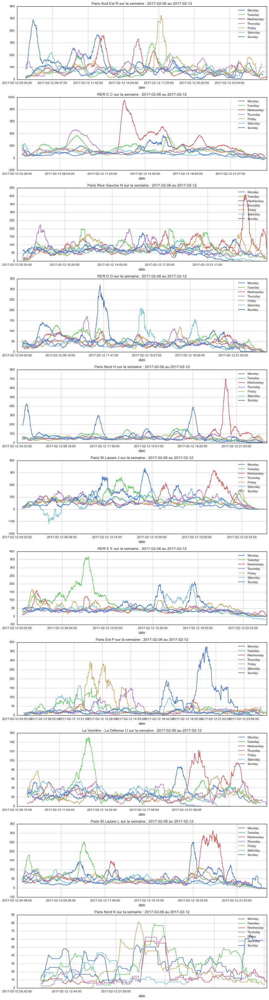

In [54]:
data_one_week = data_with_agencies[(data_with_agencies['date'] >= '2017-02-06 00:00:00') & 
                   (data_with_agencies['date'] <= '2017-02-12 23:59:59')]


l = len(data_one_day.route_short_name.unique())
fig = plt.figure(figsize=(12,4*l))

for i,route in enumerate(data_one_week.route_short_name.unique()):
    plt.subplot(l,1,i+1)
    for day in data_one_week.jour.unique():
        data_one_day = data_one_week[data_one_week['jour'] == day]
        
        a = data_one_day[data_one_day.route_short_name == route].groupby('date').mean()['delay']
        #a.plot()
        a.rolling(window=25,center=False).mean().plot(label = day)
        plt.title(get_agency_name(route) + ' ' + route + ' sur la semaine : 2017-02-06 au 2017-02-12')
        plt.tight_layout()
        plt.grid()

    plt.legend()
plt.show()


### Nombre de trains sur une semaine

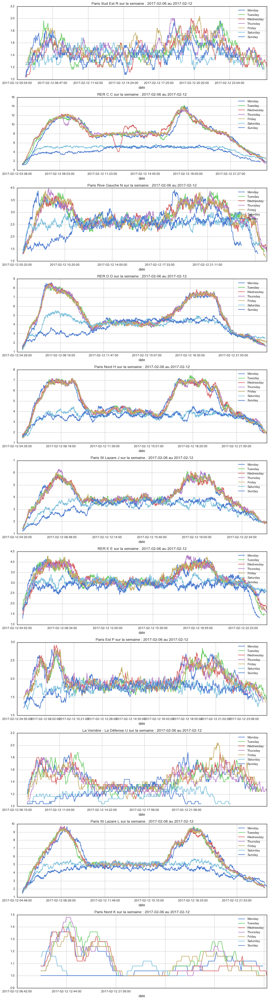

In [55]:
data_one_week = data_with_agencies[(data_with_agencies['date'] >= '2017-02-06 00:00:00') & 
                   (data_with_agencies['date'] <= '2017-02-12 23:59:59')]


l = len(data_one_day.route_short_name.unique())
fig = plt.figure(figsize=(12,4*l))

for i,route in enumerate(data_one_week.route_short_name.unique()):
    plt.subplot(l,1,i+1)
    for day in data_one_week.jour.unique():
        data_one_day = data_one_week[data_one_week['jour'] == day]
        
        a = data_one_day[data_one_day.route_short_name == route].groupby('date').count()['train_num']
        a.rolling(window=25,center=False).mean().plot(label = day)
        plt.title(get_agency_name(route) + ' ' + route + ' sur la semaine : 2017-02-06 au 2017-02-12')
        plt.tight_layout()
        plt.grid()

    plt.legend()
plt.show()

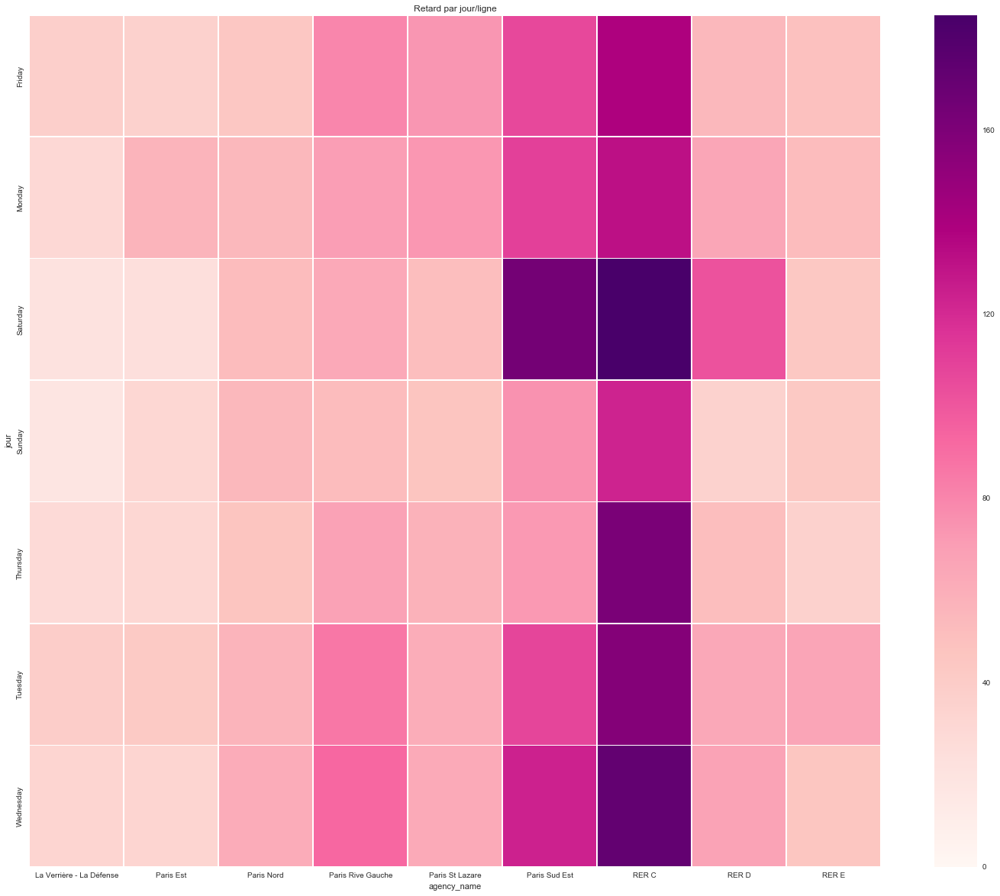

In [56]:
tmp = data_with_agencies.groupby(['agency_name'])['delay'].sum()
dir = tmp.sort_values(ascending=False).index[:100]
piv = pd.pivot_table(data = data_with_agencies[data_with_agencies['agency_name'].isin(dir)],
                                        index=["jour"],
                                        columns=['agency_name'],
                                        values=["delay"],
                                        aggfunc= np.mean)
print(piv)
fig,ax = plt.subplots(figsize=(25,20))
sns.heatmap(piv['delay'],vmin=0,annot=False,linewidth=.5,ax=ax,cmap="RdPu")
plt.title('Retard par jour/ligne')

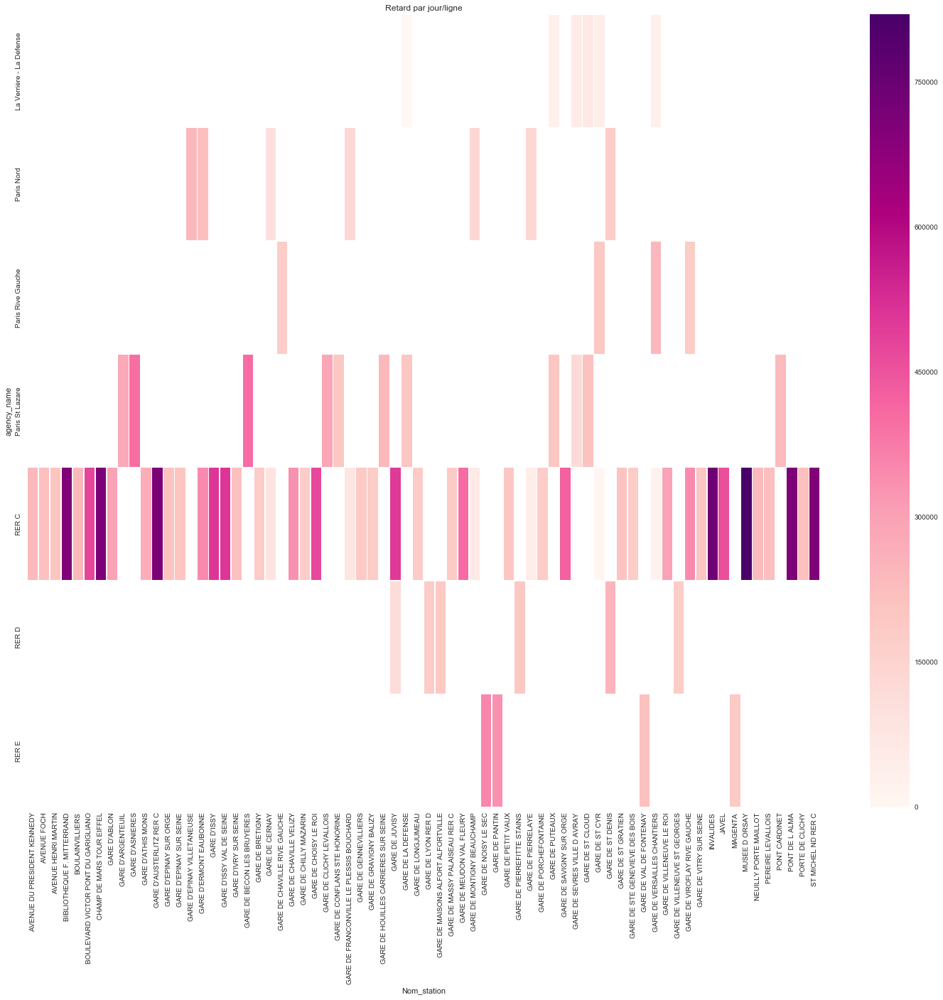

In [57]:
tmp = data_with_agencies.groupby(['Nom_station'])['delay'].sum()
dir = tmp.sort_values(ascending=False).index[:70]
piv = pd.pivot_table(data = data_with_agencies[data_with_agencies["Nom_station"].isin(dir)],
                                        index=["agency_name"],
                                        columns=["Nom_station"],
                                        values=["delay"],
                                        aggfunc= np.sum)
print(piv)
fig,ax = plt.subplots(figsize=(25,20))
sns.heatmap(piv['delay'],vmin=0,annot=False,linewidth=.5,ax=ax,cmap="RdPu")
plt.title('Retard par jour/ligne')

In [58]:
res_nbr = data_one_day.groupby('date', as_index = False)['train_num'].count()
res_delay = data_one_day.groupby('date', as_index = False)['delay'].sum()
res_nbr = res_nbr.merge(res_delay, left_on='date', right_on='date' ,how='left')

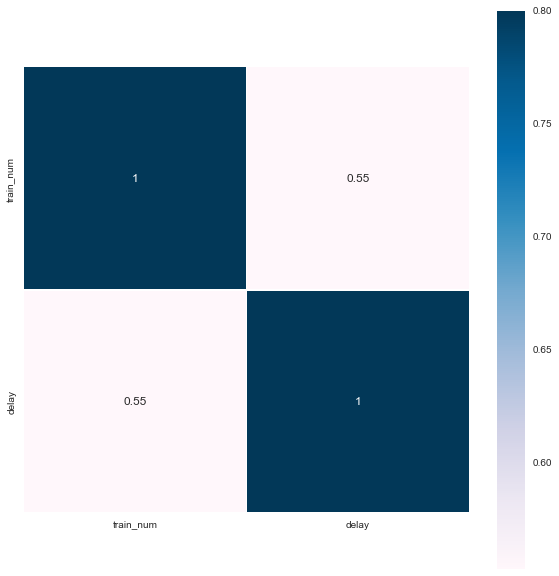

In [59]:
data_correlation = res_nbr
corr_mat = data_correlation.corr()
cmap = sns.dark_palette("#2ecc71", as_cmap=True)
plt.figure(figsize=(10,10))
sns.color_palette("YlOrRd", 10)
sns.heatmap(corr_mat, square = True, vmax = 0.8, annot = True, linewidths = .5, cmap ='PuBu')
plt.show()

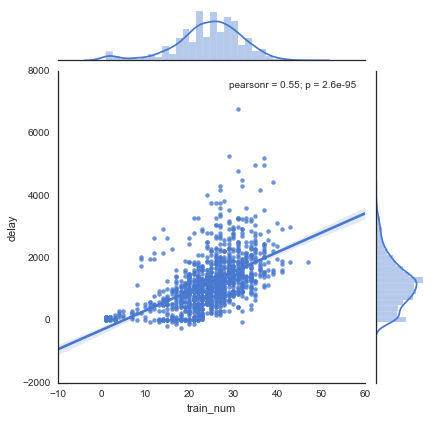

In [60]:
ax = sns.jointplot("train_num", "delay", res_nbr, kind="reg")

In [61]:
data_one_week = data_with_agencies[(data_with_agencies['date'] >= '2017-02-06 00:00:00') & 
                   (data_with_agencies['date'] <= '2017-02-12 23:59:59')]

In [62]:
res_nbr = data_one_week.groupby('date', as_index = False)['train_num'].count()
res_delay = data_one_week.groupby('date', as_index = False)['delay'].sum()
res_nbr = res_nbr.merge(res_delay, left_on='date', right_on='date' ,how='left')

In [63]:
res_nbr

,date,train_num,delay
0,2017-02-06 03:38:00,1,0.0
1,2017-02-06 03:46:00,1,0.0
2,2017-02-06 03:50:00,1,0.0
3,2017-02-06 03:54:00,1,0.0
4,2017-02-06 03:56:00,1,0.0
5,2017-02-06 03:57:00,1,0.0
6,2017-02-06 04:00:00,2,0.0
7,2017-02-06 04:02:00,1,0.0
8,2017-02-06 04:05:00,1,0.0
9,2017-02-06 04:07:00,2,120.0


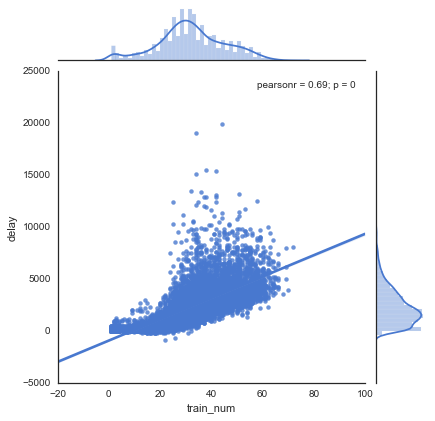

In [64]:
ax = sns.jointplot("train_num", "delay", res_nbr, kind="reg")

### Disparités de data-freshness sur nos ‘real_departures’

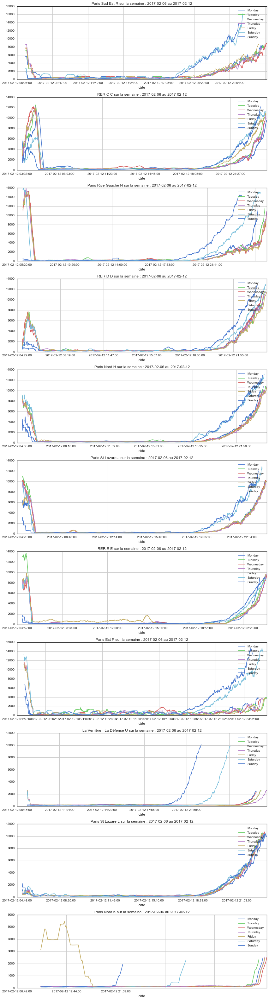

In [ ]:
data_one_week = data_with_agencies[(data_with_agencies['date'] >= '2017-02-06 00:00:00') & 
                   (data_with_agencies['date'] <= '2017-02-12 23:59:59')]


l = len(data_one_day.route_short_name.unique())
fig = plt.figure(figsize=(12,4*l))

for i,route in enumerate(data_one_week.route_short_name.unique()):
    plt.subplot(l,1,i+1)
    for day in data_one_week.jour.unique():
        data_one_day = data_one_week[data_one_week['jour'] == day]
        
        a = data_one_day[data_one_day.route_short_name == route].groupby('date').mean()['data_freshness']
        a.rolling(window=25,center=False).mean().plot(label = day)
        plt.title(get_agency_name(route) + ' ' + route + ' sur la semaine : 2017-02-06 au 2017-02-12')
        plt.tight_layout()
        plt.grid()

    plt.legend()
plt.show()

### Analyse par station

In [ ]:
import cufflinks as cf
import colorlover as cl
from plotly.graph_objs import *
import math
data_one_day = data_with_agencies[(data_with_agencies['date'] >= '2017-02-06 00:00:00') & 
                   (data_with_agencies['date'] <= '2017-02-06 23:59:59')]


for i,route in enumerate(data_one_day.route_short_name.unique()):
    a = data_one_day[data_one_day.route_short_name == route].groupby(['Nom_station'],as_index = False).mean()
    b = data_one_day[data_one_day.route_short_name == route].groupby(['Nom_station'],as_index = False).count()
    b = b[['Nom_station','train_num']]
    c = a.merge(b,on = 'Nom_station')
    c.iplot(kind='bubble', x='train_num', y='data_freshness', size='delay', text='Nom_station',
    color = 'Red', xTitle='Number of Trains', yTitle='Data Freshness',
            title = 'Analysis of Delays per Station : ' + get_agency_name(route) + ' '  + route + 
           ' of the day : 2017-02-06')
    plt.show()

### Sur toutes les données

In [ ]:
import cufflinks as cf
import colorlover as cl
from plotly.graph_objs import *
import math


for i,route in enumerate(data_with_agencies.route_short_name.unique()):
    a = data_with_agencies[data_with_agencies.route_short_name == route].groupby(['Nom_station'],as_index = False).mean()
    b = data_one_day[data_with_agencies.route_short_name == route].groupby(['Nom_station'],as_index = False).count()
    b = b[['Nom_station','train_num']]
    c = a.merge(b,on = 'Nom_station')
    c.iplot(kind='bubble', x='train_num', y='data_freshness', size='delay', text='Nom_station',
    color = 'Red', xTitle='Number of Trains', yTitle='Data Freshness',
            title = 'Analysis of Delays per Station : ' + get_agency_name(route) + ' '  + route + 
           ' of the 2 weeks')
